In [1]:
from IPython.core.display import HTML
HTML("<style>.container { width:90% !important; }</style>")

Original document on correcting aspect Ratio:
- http://research.microsoft.com/en-us/um/people/zhang/papers/whiteboardrectification.pdf

Source of original python implentation of above (get_aspect function):
- http://stackoverflow.com/questions/29559608/white-board-rectification-with-python-throws-error

Related posts:
- http://stackoverflow.com/questions/1194352/proportions-of-a-perspective-deformed-rectangle
- http://opencv-code.com/tutorials/automatic-perspective-correction-for-quadrilateral-objects/



My original imports for a notebook implementation of: http://www.pyimagesearch.com/2014/09/01/build-kick-ass-mobile-document-scanner-just-5-minutes/

In [4]:
%matplotlib inline
import glob
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np

from scipy import fftpack
from skimage.filters import threshold_adaptive
import imutils

plt.rcParams['figure.figsize'] = (25.0, 10.0)

Additional imports from Terrachild's get_aspect

In [3]:
import numpy as np
from numpy import matrix
from math import sqrt
from math import pow

In [5]:
def show_image(image, depth, title):
    if depth == 'g':
        disptemp = cv2.cvtColor(image, cv2.COLOR_GRAY2RGB)
        plt.title(title), plt.xticks([]), plt.yticks([])
        plt.imshow(disptemp)
#         plt.show()
    elif depth == 'c':
        disptemp = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        plt.title(title), plt.xticks([]), plt.yticks([])
        plt.imshow(disptemp)
#         plt.show()
    else:
        print "Unknown color type."

In [6]:
def centroid(pts):
    (tl, tr, br, bl) = pts
    x = int(round(bl[0] + br[0] + tl[0] + tr[0])/4)
    y = int(round(bl[1] + br[1] + tl[1] + tr[1])/4)
    return (x, y)

In [7]:
def get_aspect(image, pts):

    # Terrachild:
    # http://stackoverflow.com/questions/29559608/white-board-rectification-with-python-throws-error
    
    # CALCULATING THE ASPECT RATIO OF A RECTANGLE DISTORTED BY PERSPECTIVE

    #
    # BIBLIOGRAPHY:
    # [zhang-single]: "Single-View Geometry of A Rectangle
    #  With Application to Whiteboard Image Rectification"
    #  by Zhenggyou Zhang
    #  http://research.microsoft.com/users/zhang/Papers/WhiteboardRectification.pdf

    # pixel coordinates of the 4 corners of the quadrangle (m1, m2, m3, m4)
    # see [zhang-single] figure 1

    w = image.shape[0]
    h = image.shape[1]

    
    # pixel coordinates of the principal point of the image
    # for a normal camera this will be the center of the image,
    # i.e. u0=IMAGEWIDTH/2; v0 =IMAGEHEIGHT/2
    # This assumption does not hold if the image has been cropped asymmetrically

    # TODO: D.SGT need to figure out if this is the center of the IMAGE or of the object?!? 
    # !!!! seems to be the found object and not the image.  Replaced Terrachild's u0, v0 
    # with centroid.
#     u0 = image.shape[0] / 2
#     v0 = image.shape[1] / 2

    u0, v0 = centroid(pts)
    print "Centroid:", u0, v0

    # pixel aspect ratio; for a normal camera pixels are square, so s=1
    s = 1

    (tl, tr, br, bl) = pts
    print "Points"
    print "   TL:", tl
    print "   TR:", tr
    print "   BL:", bl
    print "   BR:", br
    
    # D.SGT - Rosebrach's point ordering is different than Zhang-Single.  Also, ZS has 0,0
    # in the lower left as opposed to numpy's upper left.  I think the origin is irrelevent,
    # but the rest is relatively changed.
    
    # homogenous coordinates of the quadrangle
    m1 = np.array([bl[0],bl[1],1])
    m2 = np.array([br[0],br[1],1])
    m3 = np.array([tl[0],tl[1],1])
    m4 = np.array([tr[0],tr[1],1])



    # The following equations are later used in calculating the the focal length
    # and the rectangle's aspect ratio.

    # see [zhang-single] Equation 11, 12
    k2 = np.dot(np.cross(m1, m4), m3) / np.dot(np.cross(m2, m4), m3)
    k3 = np.dot(np.cross(m1, m4), m2) / np.dot(np.cross(m3, m4), m2)


    # see [zhang-single] Equation 14,16
    n2 = k2 * m2 - m1
    n3 = k3 * m3 - m1


    # the focal length of the camera.  Equation 21    
    try:
        f = sqrt(
                 -1 / (
                        n2[2]*n3[2]*s**2
                      ) * 
                 (
                  (
                   n2[0]*n3[0] - (n2[0]*n3[2]+n2[2]*n3[0])*u0 + n2[2]*n3[2] * u0**2
                  )*s**2 + 
                  (
                   n2[1]*n3[1] - (n2[1]*n3[2]+n2[2]*n3[1])*v0 + n2[2]*n3[2] * v0**2
                  )
                 )
                )
        

        print 'Focal Length (px): ', f

        # standard pinhole camera matrix
        # see [zhang-single] Equation 1

        K = np.matrix([[f,0,u0],[0,f,v0],[0,0,1]])


        #the width/height ratio of the original rectangle
        # see [zhang-single] Equation 20

        whRatio = sqrt(
                       (np.dot(np.asarray(n2 * (K.T**-1)).reshape(-1), np.asarray((K**-1).dot(n2)).reshape(-1))) /
                       (np.dot(np.asarray(n3 * (K.T**-1)).reshape(-1), np.asarray((K**-1).dot(n3)).reshape(-1)))
                      )
    # D.Sgt - Added to cope with Terrachild's stackoverflow issue - I couldn't figure it out
    except ValueError:
        print 'Calculation failed.  Using approximated Aspect Ratio (r-hat).'
        whRatio = -1
        

    return whRatio

In [8]:
# All the smart parts of this code taken from 
# http://www.pyimagesearch.com/2014/09/01/build-kick-ass-mobile-document-scanner-just-5-minutes/
# by Adrian Rosebrock.  I just made it work in a notebook.
# Other changes to use zhang-single aspect ratio are noted.

def order_points(pts):
    # initialzie a list of coordinates that will be ordered
    # such that the first entry in the list is the top-left,
    # the second entry is the top-right, the third is the
    # bottom-right, and the fourth is the bottom-left
    rect = np.zeros((4, 2), dtype = "float32")

    # the top-left point will have the smallest sum, whereas
    # the bottom-right point will have the largest sum
    s = pts.sum(axis = 1)
    rect[0] = pts[np.argmin(s)]
    rect[2] = pts[np.argmax(s)]

    # now, compute the difference between the points, the
    # top-right point will have the smallest difference,
    # whereas the bottom-left will have the largest difference
    diff = np.diff(pts, axis = 1)
    rect[1] = pts[np.argmin(diff)]
    rect[3] = pts[np.argmax(diff)]

    # return the ordered coordinates
    return rect

def four_point_transform(image, pts):
    # obtain a consistent order of the points and unpack them
    # individually
    rect = order_points(pts)
    (tl, tr, br, bl) = rect

    # compute the width of the new image, which will be the
    # maximum distance between bottom-right and bottom-left
    # x-coordiates or the top-right and top-left x-coordinates
    widthA = np.sqrt(((br[0] - bl[0]) ** 2) + ((br[1] - bl[1]) ** 2))
    widthB = np.sqrt(((tr[0] - tl[0]) ** 2) + ((tr[1] - tl[1]) ** 2))
    What = max(int(widthA), int(widthB))

    # compute the height of the new image, which will be the
    # maximum distance between the top-right and bottom-right
    # y-coordinates or the top-left and bottom-left y-coordinates
    heightA = np.sqrt(((tr[0] - br[0]) ** 2) + ((tr[1] - br[1]) ** 2))
    heightB = np.sqrt(((tl[0] - bl[0]) ** 2) + ((tl[1] - bl[1]) ** 2))

    # Replace Adrian's height/width with one calculated from the zhang-single
    # aspect ratio (pg 15, Sec 3.3)
    # Get the original ratio and feed it into get_aspect()
    # D.Sgt
    Hhat = max(int(heightA), int(heightB))
    rhat = 1.0*What / Hhat

    print "Origianal Dim:", image.shape[0:2] 
    print "W-hat:", What
    print "H-hat:", Hhat
    print "r-hat:", rhat
    
    r = get_aspect(image, rect)
    
    # Sometimes the zhang-single focal length formula 21 is getting a negative number 
    # left for the square root.  I can't figure out why.  
    # In the mean time I'm returning -1 when it occurs so we can just use the original
    # approximated aspect ratio.
    # D.Sgt
    if r < 0:
        r = rhat
    print "r:", r

    # For some reason, I see that occasionally the calculated aspect ratio is inverted
    # but I can't figure out why.  Corners in the wrong order?  Doesn't appear to be.
    # I have no clue why this is but the ratio looks good, just inverted.  So, I'm 
    # testing if the approximated ratio and calculated ratio are on the opposite sides
    # of 1 (rotated 90 degrees).  If so, take the inverse of the calculated ratio.
    # D.Sgt
    if rhat > 1 and r < 1:
        r = 1.0/r
        print "inverted r to:", r

    if rhat > r:
        maxWidth = What
        maxHeight = int(round(maxWidth / r))
    else:
        maxHeight = Hhat
        maxWidth =  int(round(maxHeight * r))
        

#     8.5 x 11 has aspect ratios of 0.772727272727 or 1.29411764705883 depending on orientation

    print "maxHeight:", maxHeight
    print "maxWidth:", maxWidth

    # now that we have the dimensions of the new image, construct
    # the set of destination points to obtain a "birds eye view",
    # (i.e. top-down view) of the image, again specifying points
    # in the top-left, top-right, bottom-right, and bottom-left
    # order
    dst = np.array([
        [0, 0],
        [maxWidth - 1, 0],
        [maxWidth - 1, maxHeight - 1],
        [0, maxHeight - 1]], dtype = "float32")

    # compute the perspective transform matrix and then apply it
    M = cv2.getPerspectiveTransform(rect, dst)
    warped = cv2.warpPerspective(image, M, (maxWidth, maxHeight))

    # return the warped image
    return warped

In [9]:
def crop_image(filename, mint=50, maxt=100):
    # load the image and compute the ratio of the old height
    # to the new height, clone it, and resize it
    image = cv2.imread(filename)
    ratio = image.shape[0] / 500.0
    orig = image.copy()
    image = imutils.resize(image, height = 500)

    # convert the image to grayscale, blur it, and find edges
    # in the image
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    gray = cv2.GaussianBlur(gray, (5, 5), 0)
    edged = cv2.Canny(gray, mint, maxt)


    # find the contours in the edged image, keeping only the
    # largest ones, and initialize the screen contour
    (cnts, _) = cv2.findContours(edged.copy(), cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    cnts = sorted(cnts, key = cv2.contourArea, reverse = True)[:5]

    # loop over the contours
    for c in cnts:
        # approximate the contour
        peri = cv2.arcLength(c, True)
        approx = cv2.approxPolyDP(c, 0.02 * peri, True)

        # if our approximated contour has four points, then we
        # can assume that we have found our screen
        if len(approx) == 4:
            screenCnt = approx
            break

    # show the contour (outline) of the piece of paper
    cv2.drawContours(image, [screenCnt], -1, (0, 255, 0), 2)


    # apply the four point transform to obtain a top-down
    # view of the original image
    warped = four_point_transform(orig, screenCnt.reshape(4, 2) * ratio)

    # convert the warped image to grayscale, then threshold it
    # to give it that 'black and white' paper effect
    warped = cv2.cvtColor(warped, cv2.COLOR_BGR2GRAY)
    warped = threshold_adaptive(warped, 250, offset = 10)
    warped = warped.astype("uint8") * 255

    # show the original and scanned images
    fig = plt.figure()
    plt.subplot(141)
    show_image(orig, 'c', os.path.basename(filename))
    plt.subplot(142)
    show_image(edged, 'g', 'Edges')
    plt.subplot(143)
    show_image(image, 'c', 'Biggest Closed Trapezoid')
    plt.subplot(144)
    show_image(warped, 'g', 'Cropped/Transformed')

    return


Origianal Dim: (3024, 4032)
W-hat: 2965
H-hat: 1773
r-hat: 1.67230682459
Centroid: 2095 1397
Points
   TL: [ 889.05603027  731.8079834 ]
   TR: [ 3078.43188477   374.97601318]
   BL: [  737.85601807  2437.34399414]
   BR: [ 3677.18408203  2044.22399902]
Focal Length (px):  2661.82787842
r: 1.36058226045
maxHeight: 2179
maxWidth: 2965


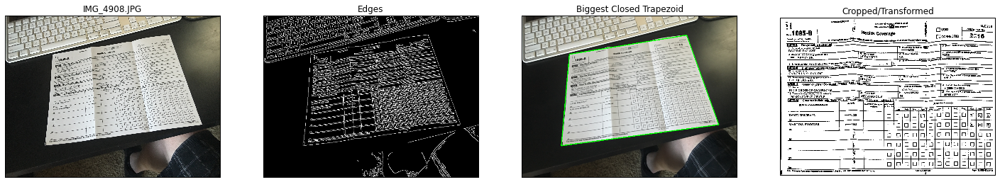

In [11]:
crop_image('/Users/dave.sergeant/Downloads/2016.02.21/IMG_4908.JPG')

An example of the calculated ratio looking correct, but rotated:

Origianal Dim: (1836, 3264)
W-hat: 2647
H-hat: 1267
r-hat: 2.08918705604
Centroid: 1619 953
Points
   TL: [ 723.38397217  359.85598755]
   TR: [ 2489.6159668    367.20001221]
   BL: [  308.44799805  1538.56799316]
   BR: [ 2955.95996094  1545.9119873 ]
Focal Length (px):  8024.21738004
r: 0.620568509669
inverted r to: 1.61142562734
maxHeight: 1643
maxWidth: 2647


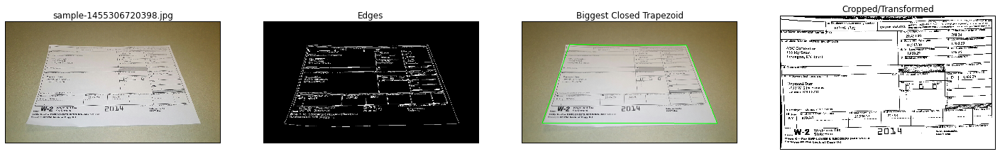

In [10]:
crop_image('/Users/dave.sergeant/Downloads/2016.02.16/Full Images/sample-1455306720398.jpg')

Origianal Dim: (3264, 1836)
W-hat: 1599
H-hat: 2029
r-hat: 0.788072942336
Centroid: 907 1730
Points
   TL: [ 430.84799194  724.60797119]
   TR: [ 1377.40795898   750.7199707 ]
   BL: [  110.97599792  2728.70410156]
   BR: [ 1710.33605957  2715.64794922]
Focal Length (px):  1774.40721892
r: 0.545051505982
maxHeight: 2934
maxWidth: 1599


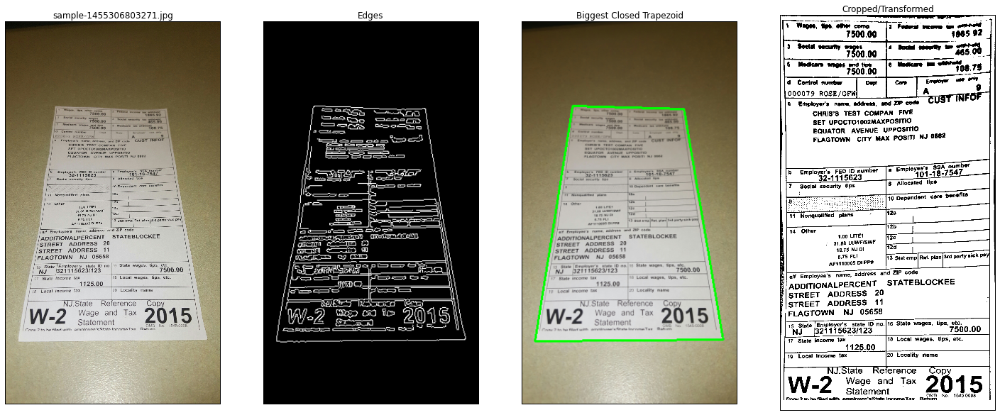

In [12]:
crop_image('/Users/dave.sergeant/Downloads/2016.02.16/Full Images/sample-1455306803271.jpg')

Origianal Dim: (3264, 1836)
W-hat: 1586
H-hat: 2011
r-hat: 0.788662357036
Centroid: 876 1648
Points
   TL: [ 124.03199768  652.79998779]
   TR: [ 1625.4720459    639.74401855]
   BL: [   84.86399841  2650.36791992]
   BR: [ 1671.16796875  2650.36791992]
Focal Length (px):  4852.78216882
r: 0.763239494164
maxHeight: 2078
maxWidth: 1586


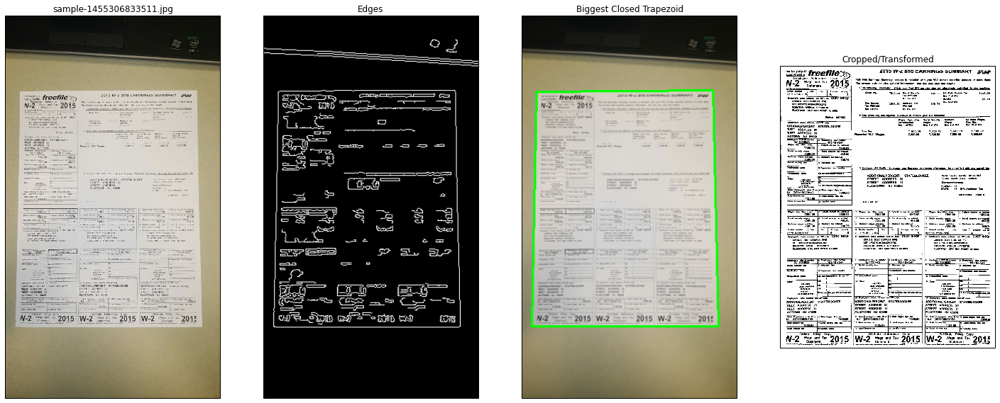

In [13]:
crop_image('/Users/dave.sergeant/Downloads/2016.02.16/Full Images/sample-1455306833511.jpg')

In [ ]:
path = '/Users/dave.sergeant/Downloads/2016.02.16/Full Images/*.jpg'
for fname in glob.glob(path):
    print "crop_image(\'{}\')".format(fname)

Origianal Dim: (1836, 3264)
W-hat: 2647
H-hat: 1267
r-hat: 2.08918705604
Centroid: 1619 953
Points
   TL: [ 723.38397217  359.85598755]
   TR: [ 2489.6159668    367.20001221]
   BL: [  308.44799805  1538.56799316]
   BR: [ 2955.95996094  1545.9119873 ]
Focal Length (px):  8024.21738004
r: 0.620568509669
inverted r to: 1.61142562734
maxHeight: 1643
maxWidth: 2647


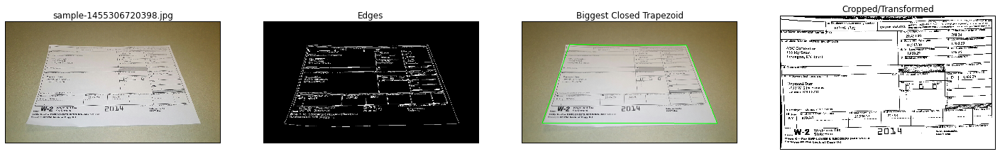

In [14]:
crop_image('/Users/dave.sergeant/Downloads/2016.02.16/Full Images/sample-1455306720398.jpg')

Origianal Dim: (3264, 1836)
W-hat: 1691
H-hat: 2201
r-hat: 0.768287142208
Centroid: 920 1583
Points
   TL: [ 430.84799194  476.54400635]
   TR: [ 1468.80004883   528.76800537]
   BL: [   45.69599915  2643.84008789]
   BR: [ 1736.44799805  2683.00805664]
Focal Length (px):  1960.24763235
r: 0.546627571784
maxHeight: 3094
maxWidth: 1691


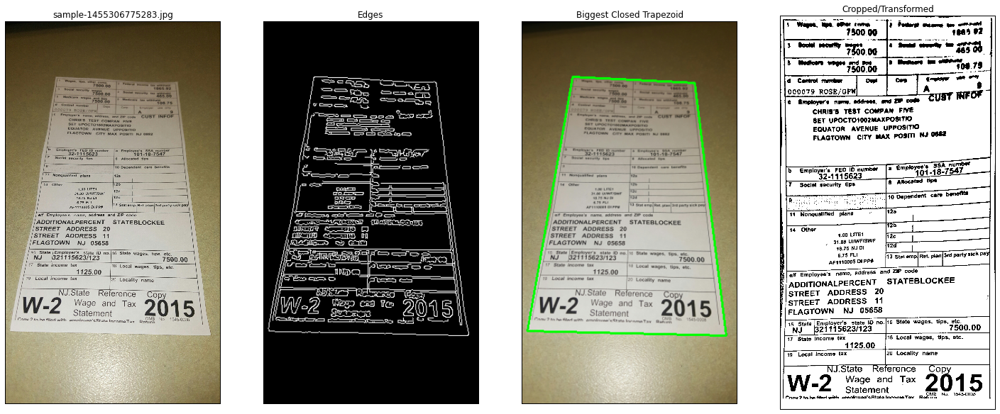

In [15]:
crop_image('/Users/dave.sergeant/Downloads/2016.02.16/Full Images/sample-1455306775283.jpg')

Origianal Dim: (3264, 1836)
W-hat: 1599
H-hat: 2029
r-hat: 0.788072942336
Centroid: 907 1730
Points
   TL: [ 430.84799194  724.60797119]
   TR: [ 1377.40795898   750.7199707 ]
   BL: [  110.97599792  2728.70410156]
   BR: [ 1710.33605957  2715.64794922]
Focal Length (px):  1774.40721892
r: 0.545051505982
maxHeight: 2934
maxWidth: 1599


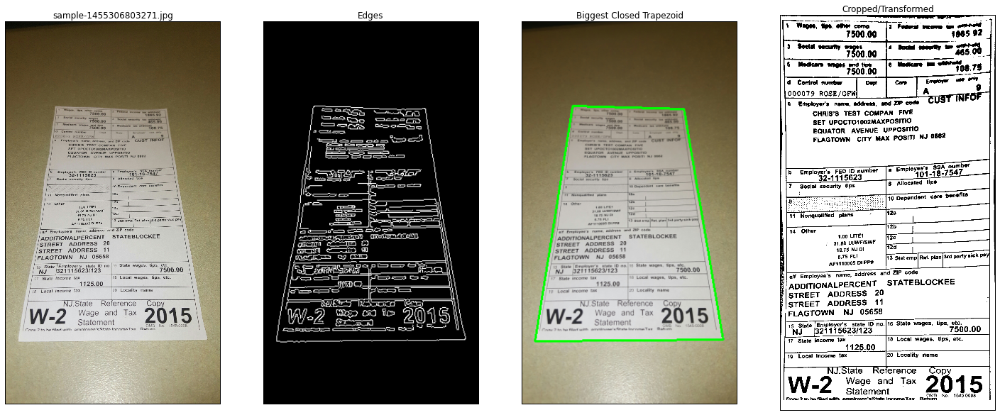

In [16]:
crop_image('/Users/dave.sergeant/Downloads/2016.02.16/Full Images/sample-1455306803271.jpg')

Origianal Dim: (3264, 1836)
W-hat: 1586
H-hat: 2011
r-hat: 0.788662357036
Centroid: 876 1648
Points
   TL: [ 124.03199768  652.79998779]
   TR: [ 1625.4720459    639.74401855]
   BL: [   84.86399841  2650.36791992]
   BR: [ 1671.16796875  2650.36791992]
Focal Length (px):  4852.78216882
r: 0.763239494164
maxHeight: 2078
maxWidth: 1586


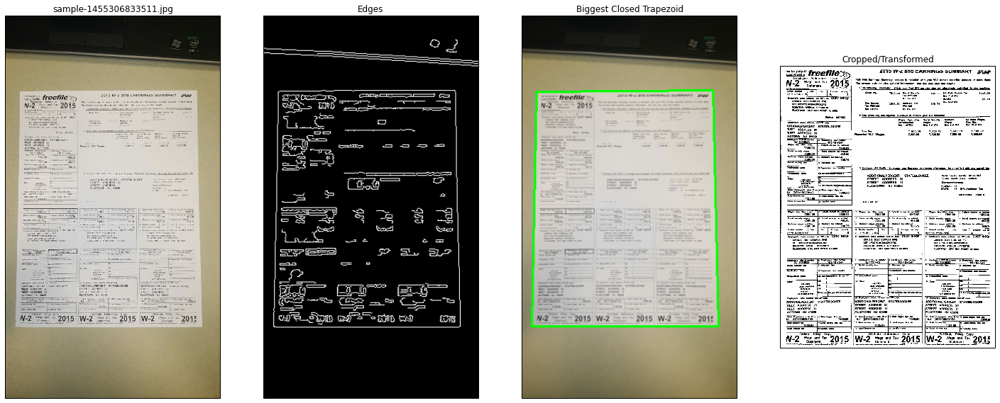

In [17]:
crop_image('/Users/dave.sergeant/Downloads/2016.02.16/Full Images/sample-1455306833511.jpg')

Origianal Dim: (3264, 1836)
W-hat: 1488
H-hat: 1919
r-hat: 0.775403856175
Centroid: 909 1785
Points
   TL: [ 208.89599609  816.        ]
   TR: [ 1651.58398438   842.11199951]
   BL: [  143.61599731  2722.17602539]
   BR: [ 1632.          2761.34399414]
Focal Length (px):  493.056222625
r: 0.76601395063
maxHeight: 1943
maxWidth: 1488


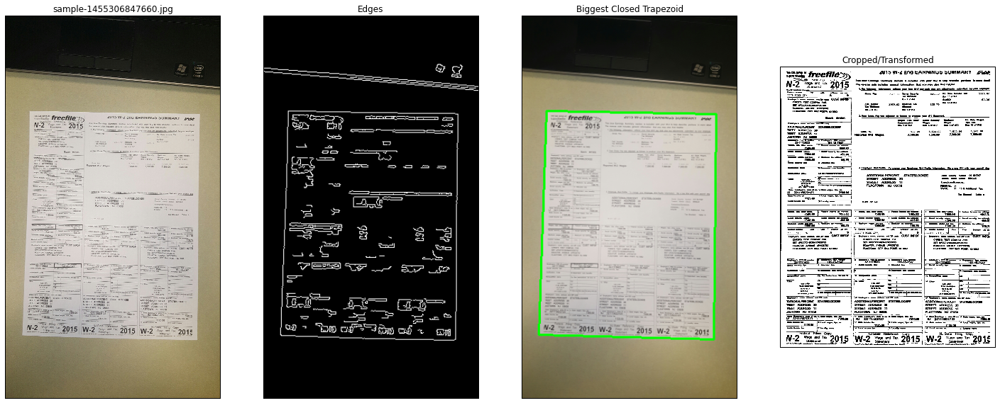

In [18]:
crop_image('/Users/dave.sergeant/Downloads/2016.02.16/Full Images/sample-1455306847660.jpg')

A few examples follow that have equation 21 [zhang-single] result in a negative number:

Origianal Dim: (3264, 1836)
W-hat: 1468
H-hat: 1899
r-hat: 0.773038441285
Centroid: 938 1770
Points
   TL: [ 215.42399597  822.52801514]
   TR: [ 1664.64001465   822.52801514]
   BL: [  202.36799622  2715.64794922]
   BR: [ 1671.16796875  2722.17602539]
Calculation failed.  Using approximated Aspect Ratio (r-hat).
r: 0.773038441285
maxHeight: 1899
maxWidth: 1468


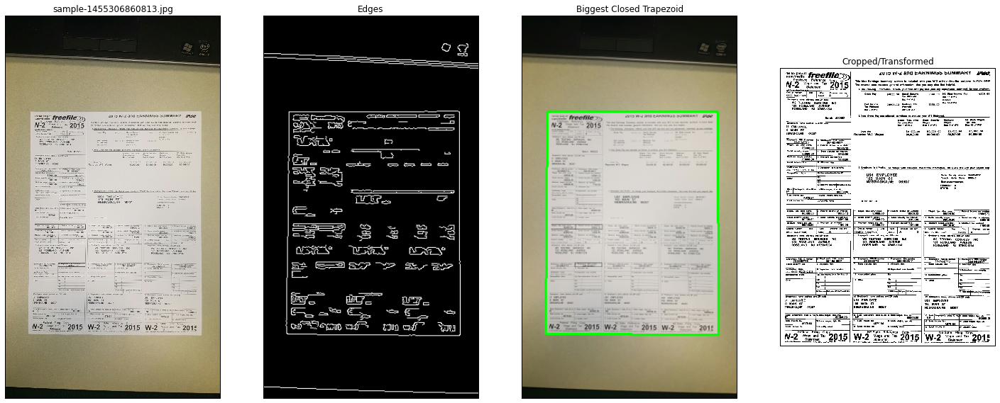

In [19]:
crop_image('/Users/dave.sergeant/Downloads/2016.02.16/Full Images/sample-1455306860813.jpg')

Origianal Dim: (3264, 1836)
W-hat: 1469
H-hat: 1880
r-hat: 0.781382978723
Centroid: 899 1684
Points
   TL: [ 202.36799622  750.7199707 ]
   TR: [ 1612.41601562   750.7199707 ]
   BL: [  156.67199707  2604.67211914]
   BR: [ 1625.4720459   2630.78393555]
Calculation failed.  Using approximated Aspect Ratio (r-hat).
r: 0.781382978723
maxHeight: 1880
maxWidth: 1469


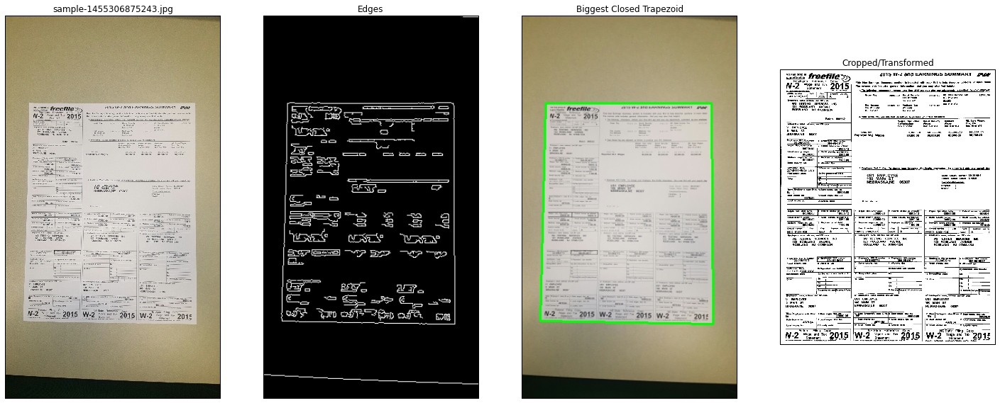

In [20]:
crop_image('/Users/dave.sergeant/Downloads/2016.02.16/Full Images/sample-1455306875243.jpg')

In [ ]:
path = '/Users/dave.sergeant/Downloads/2016.02.16/Full Images/*.jpg'
for fname in glob.glob(path):
    crop_image(fname)

Origianal Dim: (3024, 4032)
W-hat: 2933
H-hat: 1791
r-hat: 1.63763260748
Centroid: 1944 1512
Points
   TL: [ 822.52801514  653.184021  ]
   TR: [ 3042.14404297   628.99200439]
   BL: [  489.88800049  2413.15209961]
   BR: [ 3423.16796875  2352.67211914]
Calculation failed.  Using approximated Aspect Ratio (r-hat).
r: 1.63763260748
maxHeight: 1791
maxWidth: 2933


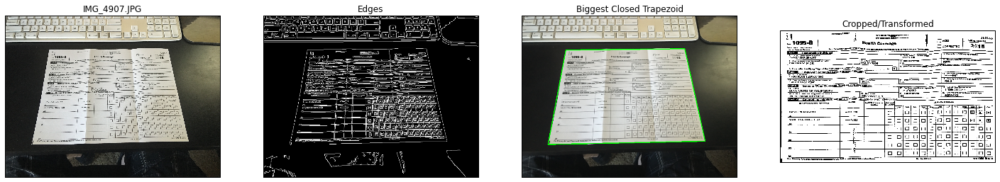

In [21]:
crop_image('/Users/dave.sergeant/Downloads/2016.02.21/IMG_4907.JPG')

Origianal Dim: (4032, 3024)
W-hat: 1581
H-hat: 3284
r-hat: 0.481425091352
Centroid: 1649 2072
Points
   TL: [ 395.13598633  806.40002441]
   TR: [ 1919.23205566   790.27197266]
   BL: [ 1556.35205078  3878.78393555]
   BR: [ 2725.63208008  2814.3359375 ]
Calculation failed.  Using approximated Aspect Ratio (r-hat).
r: 0.481425091352
maxHeight: 3284
maxWidth: 1581


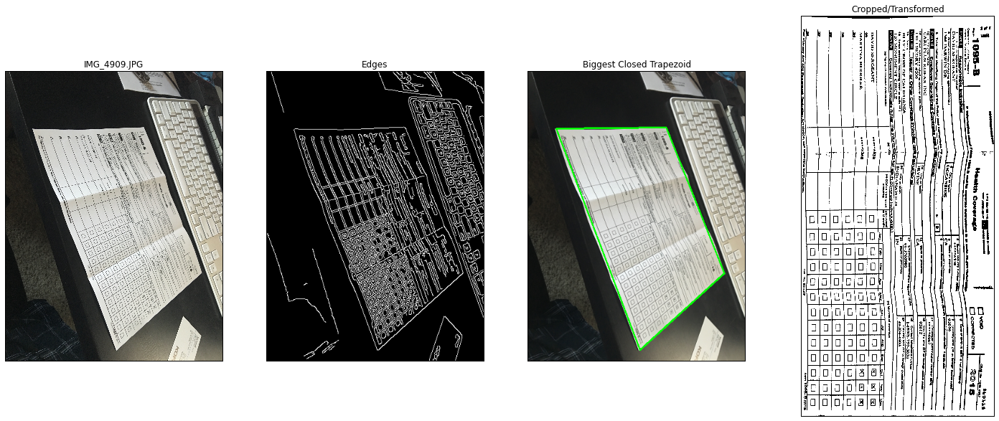

In [23]:
crop_image('/Users/dave.sergeant/Downloads/2016.02.21/IMG_4909.JPG')

In [ ]:
path = '/private/var/folders/2k/zf5h9bkn3xn005ccfjw9f35r_bxrp1/T/com.microsoft.Outlook/Outlook Temp/Test Set/*.JPG'
for fname in glob.glob(path):
    crop_image(fname)